In [1]:
from matplotlib import rc
from matplotlib.animation import FuncAnimation
import torch

rc("animation",html="jshtml")


Classical period ≈ 0.064, Revival time ≈ 1.273


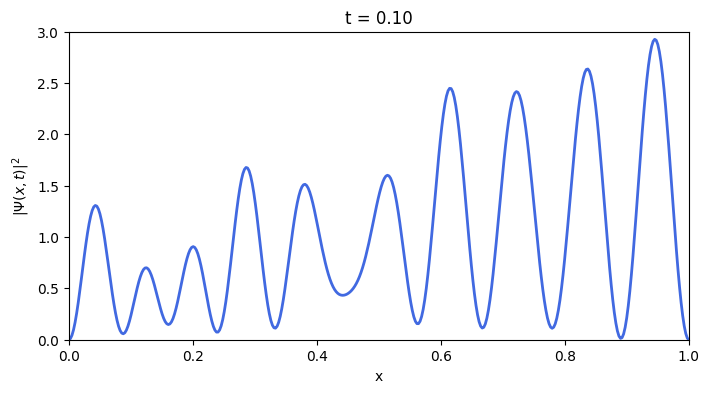

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# --- Physical parameters ---
L = 1.0             # Box length
m = 1.0             # Particle mass
hbar = 1.0          # Planck's constant (set to 1 for simplicity)

# --- Wave packet parameters ---
n0 = 10            # Central quantum number
sigma_n = 2         # Width in n-space (spread of momentum)
x0 = 0.3 * L        # Initial position
N_max = 40          # Number of eigenstates to include in the sum

# --- Derived quantities ---
E = lambda n: (n**2 * np.pi**2 * hbar**2) / (2 * m * L**2)
phi = lambda n, x: np.sqrt(2 / L) * np.sin(n * np.pi * x / L)

# Discretize space
Nx = 400
x = np.linspace(0, L, Nx)

# Coefficients for Gaussian envelope centered at n0
def c_n(n):
    """Gaussian weighting in n with phase for initial position x0"""
    return np.exp(-0.5 * ((n - n0) / sigma_n) ** 2) * np.exp(-1j * n * np.pi * x0 / L)

# Normalize coefficients
n_vals = np.arange(1, N_max + 1)
coeffs = np.array([c_n(n) for n in n_vals])
coeffs /= np.sqrt(np.sum(np.abs(coeffs)**2))

# --- Build animation ---
fig, ax = plt.subplots(figsize=(8, 4))
line, = ax.plot([], [], lw=2, color='royalblue')
ax.set_xlim(0, L)
ax.set_ylim(0, 3)
ax.set_xlabel("x")
ax.set_ylabel(r"$|\Psi(x,t)|^2$")
ax.set_title("Wave packet in an infinite square well")

# Precompute eigenfunctions on the grid
phi_matrix = np.array([phi(n, x) for n in n_vals])

def psi_t(t):
    """Compute Psi(x,t) for a given time t"""
    phase_factors = np.exp(-1j * E(n_vals) * t / hbar)
    psi = np.dot(coeffs * phase_factors, phi_matrix)
    return psi

# Classical and revival times
v0 = n0 * np.pi * hbar / (m * L)
T_classical = 2 * L / v0
T_rev = 4 * m * L**2 / (np.pi * hbar)
print(f"Classical period ≈ {T_classical:.3f}, Revival time ≈ {T_rev:.3f}")

# Time stepping
frames = 300
t_max = 1.5 * T_classical  # Animate about 1.5 classical bounces
t_vals = np.linspace(0, t_max, frames)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t = t_vals[frame]
    psi = psi_t(t)
    prob_density = np.abs(psi)**2
    line.set_data(x, prob_density)
    ax.set_title(f"t = {t:.2f}")
    return line,

ani = FuncAnimation(fig, update, frames=frames, init_func=init, blit=True, interval=40)

ani